In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns',100)
import warnings
warnings.filterwarnings('ignore')
df=pd.read_csv('D:/Data Analysis/mobile_price/train.csv')
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


In [2]:
df.shape

(2000, 21)

In [3]:
df.size

42000

In [4]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [6]:
df.isnull().values.sum()

0

In [7]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [8]:
#Converting the RAM values from MB to GB
df['ram']=round(df['ram']/1024,1)
df.head(20)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2.5,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2.6,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2.5,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2.7,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1.4,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,7,1004,1654,1.0,17,1,10,1,0,0,1
6,1821,0,1.7,0,4,1,10,0.8,139,8,10,381,1018,3.1,13,8,18,1,0,1,3
7,1954,0,0.5,1,0,0,24,0.8,187,4,0,512,1149,0.7,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,14,386,836,1.1,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,15,1137,1224,0.5,19,10,12,1,0,0,0


In [9]:
for feature in df.columns:
    print("{} features has {} no of uniques_values".format(feature,df[feature].nunique()))

battery_power features has 1094 no of uniques_values
blue features has 2 no of uniques_values
clock_speed features has 26 no of uniques_values
dual_sim features has 2 no of uniques_values
fc features has 20 no of uniques_values
four_g features has 2 no of uniques_values
int_memory features has 63 no of uniques_values
m_dep features has 10 no of uniques_values
mobile_wt features has 121 no of uniques_values
n_cores features has 8 no of uniques_values
pc features has 21 no of uniques_values
px_height features has 1137 no of uniques_values
px_width features has 1109 no of uniques_values
ram features has 38 no of uniques_values
sc_h features has 15 no of uniques_values
sc_w features has 19 no of uniques_values
talk_time features has 19 no of uniques_values
three_g features has 2 no of uniques_values
touch_screen features has 2 no of uniques_values
wifi features has 2 no of uniques_values
price_range features has 4 no of uniques_values


# From Numeric features to continous and discrete features

In [10]:
dis_fea=[feature for feature in df.columns[:-1]if df[feature].nunique()<=26]
con_fea=[feature for feature in df.columns[:-1]if feature not in dis_fea]

In [11]:
dis_fea

['blue',
 'clock_speed',
 'dual_sim',
 'fc',
 'four_g',
 'm_dep',
 'n_cores',
 'pc',
 'sc_h',
 'sc_w',
 'talk_time',
 'three_g',
 'touch_screen',
 'wifi']

In [12]:
con_fea

['battery_power', 'int_memory', 'mobile_wt', 'px_height', 'px_width', 'ram']

In [13]:
len(dis_fea)

14

# Data visulization & Analysis

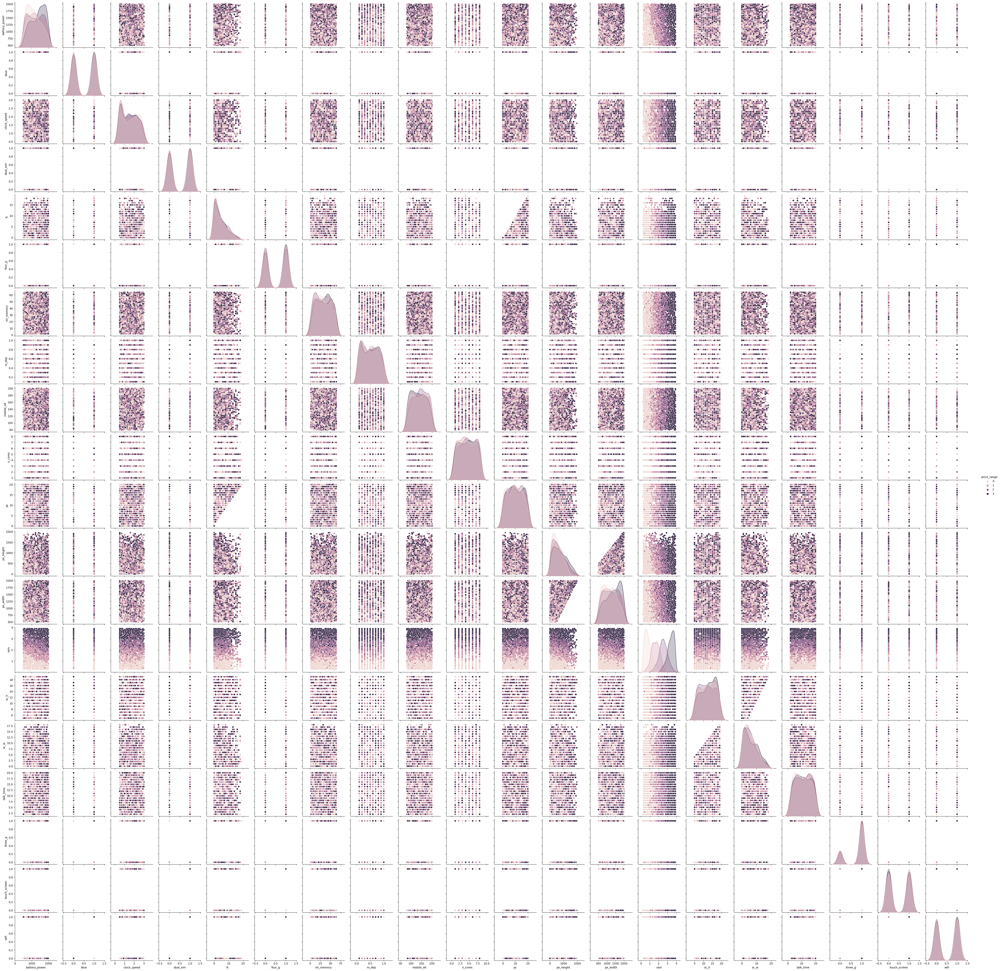

In [14]:
sns.pairplot(df,hue='price_range')

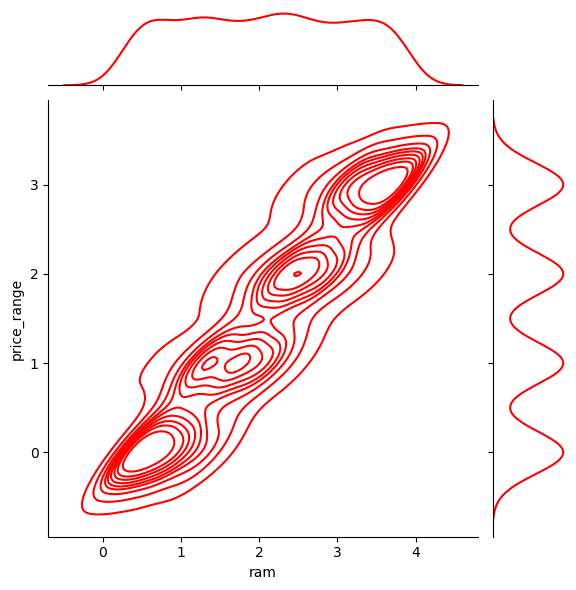

In [15]:
#Ram price demand
sns.jointplot(x='ram',y='price_range',data=df,color='red',kind='kde');

<AxesSubplot:xlabel='price_range', ylabel='int_memory'>

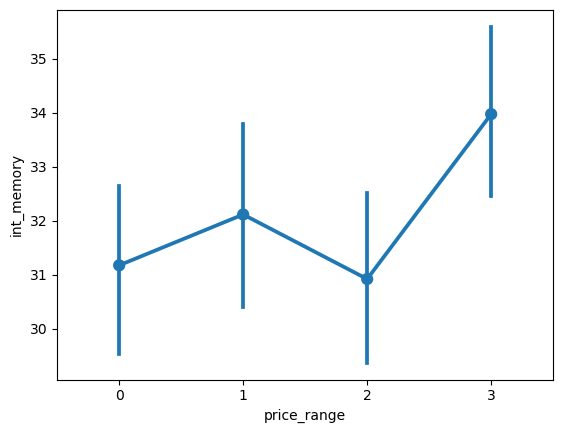

In [16]:
#Internal Memory vs Price range
sns.pointplot(y='int_memory',x='price_range',data=df)

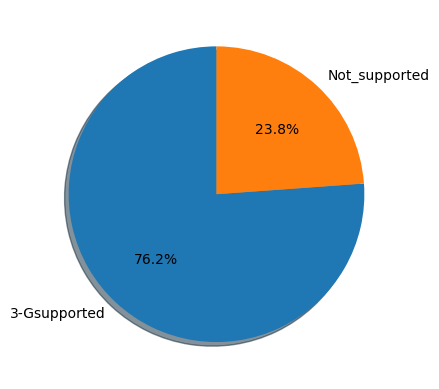

In [17]:
# % of phnoes which support 3G
labels=['3-Gsupported','Not_supported']
values=df['three_g'].value_counts().values
fig1,ax1=plt.subplots()
ax1.pie(values,labels=labels,autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

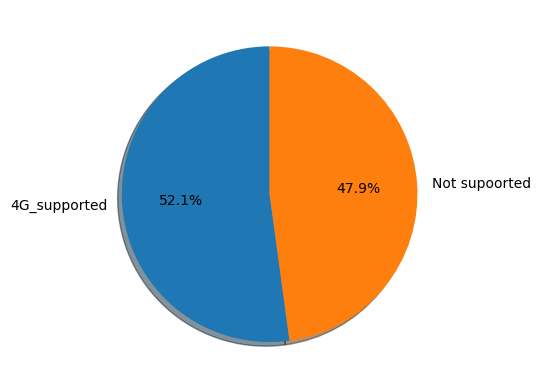

In [18]:
# % of phones which support 4G
labels4g=['4G_supported','Not supoorted']
values4g=df['four_g'].value_counts().values
fig1,ax1=plt.subplots()
ax1.pie(values4g,labels=labels4g,autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

<AxesSubplot:xlabel='price_range', ylabel='battery_power'>

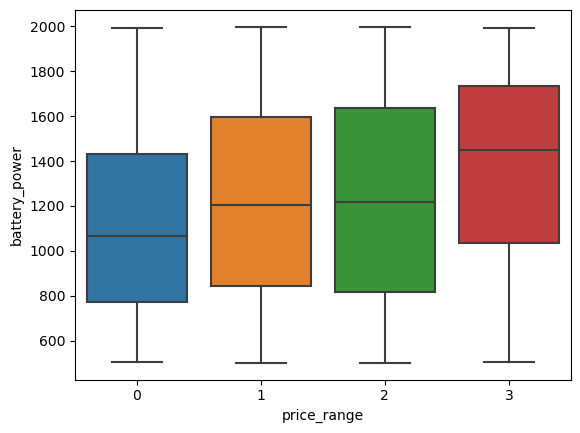

In [19]:
#Battery Power vs Price range
sns.boxplot(x='price_range',y='battery_power',data=df)

Text(0.5, 0, 'MegaPixels')

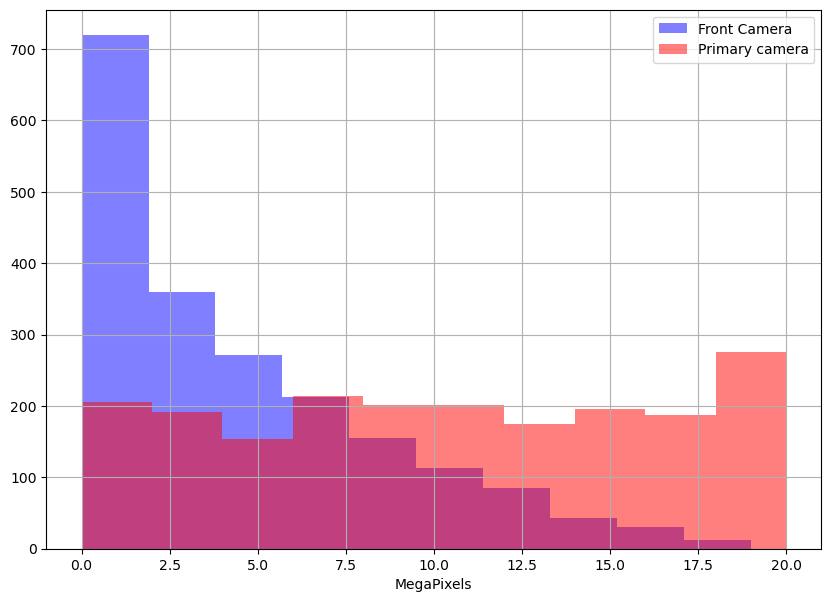

In [20]:
# No: of phones vs camera megapixels of front and primary camera
plt.figure(figsize=(10,7))
df['fc'].hist(alpha=0.5,color='blue',label='Front Camera')
df['pc'].hist(alpha=0.5,color='red',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

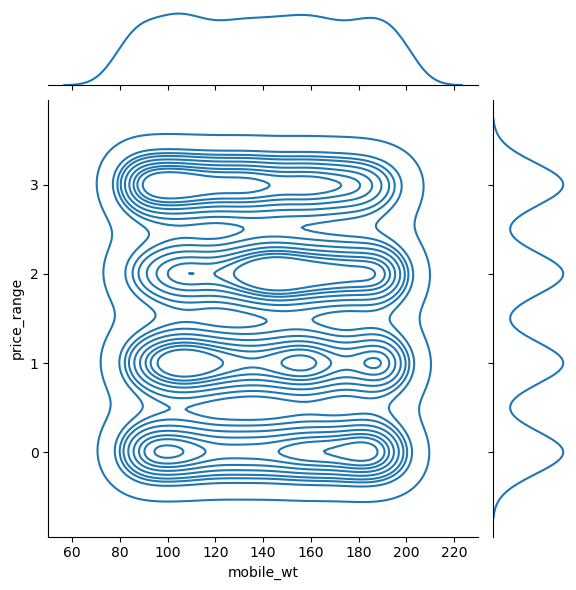

In [21]:
# Mobile weight vs Price range
sns.jointplot(x='mobile_wt',y='price_range',data=df,kind='kde')

<AxesSubplot:xlabel='price_range', ylabel='talk_time'>

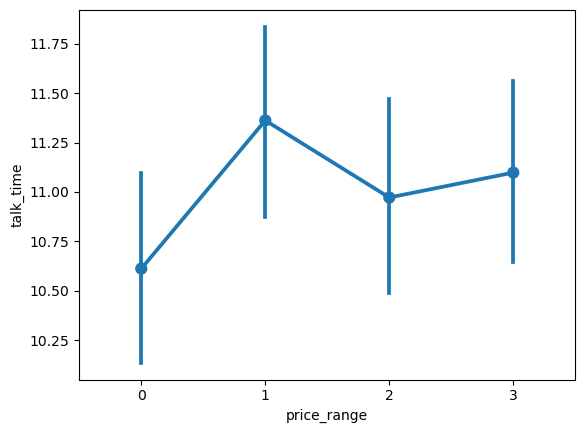

In [22]:
#Talk time vs price range
sns.pointplot(y='talk_time',x='price_range',data=df)

# Analysis of discrete features

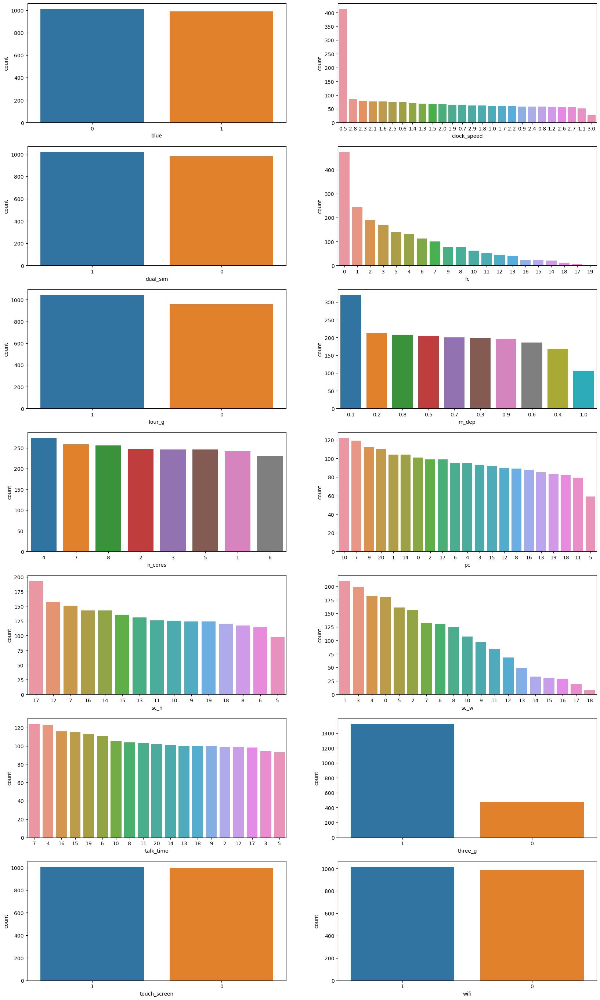

In [23]:
c=1
plt.figure(figsize=(20,80))
for feature in dis_fea:
    plt.subplot(16,2,c)
    sns.countplot(data=df,x=feature,order=df[feature].value_counts().index)
    c+=1

# Comparison of price range and discrete features

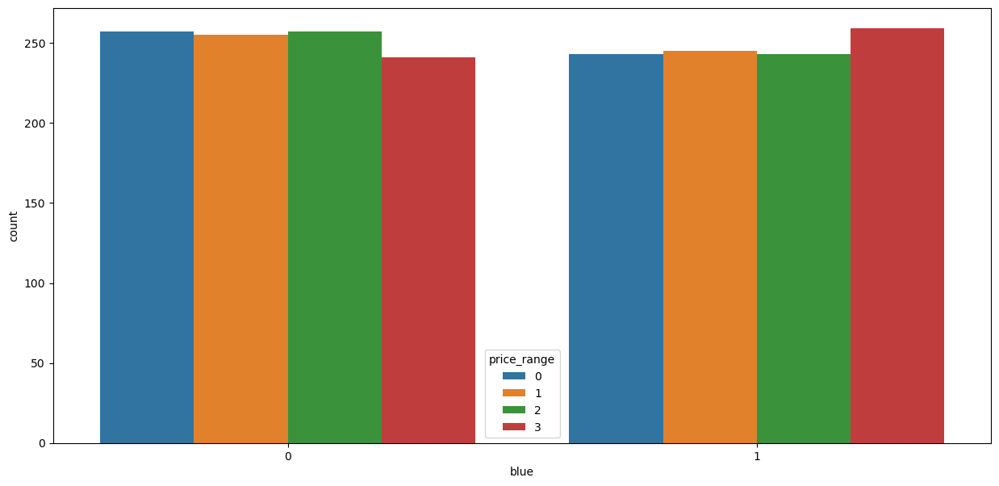

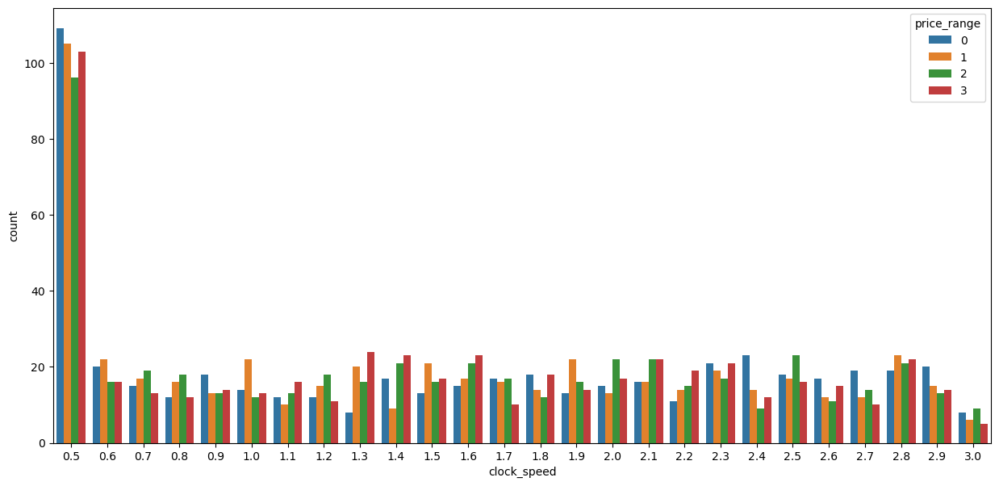

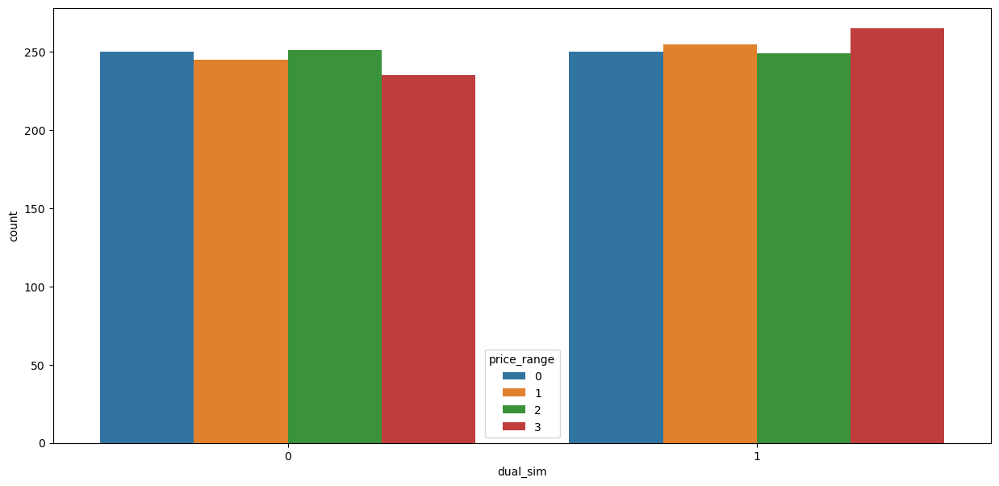

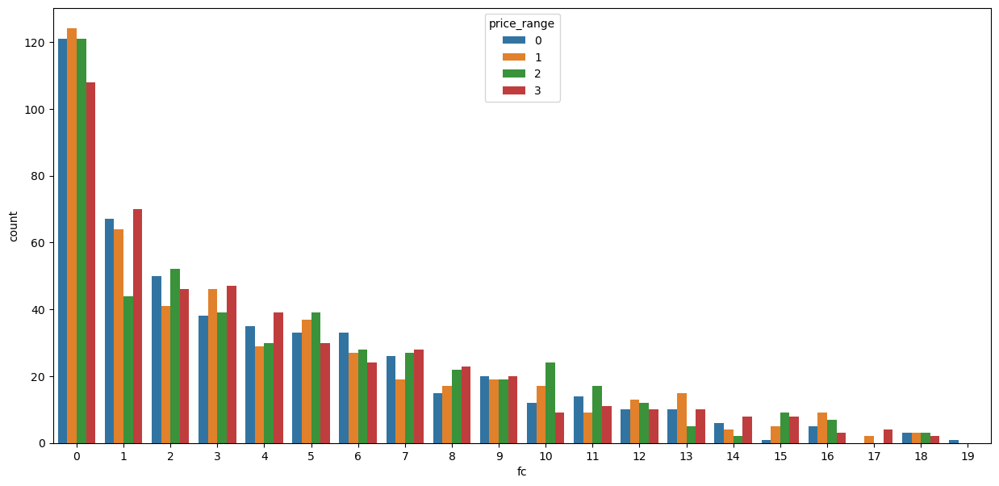

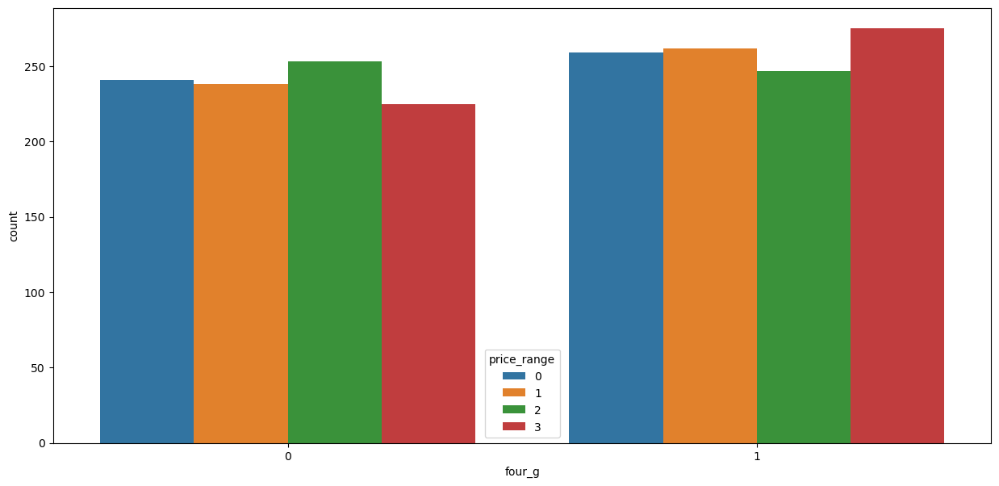

...

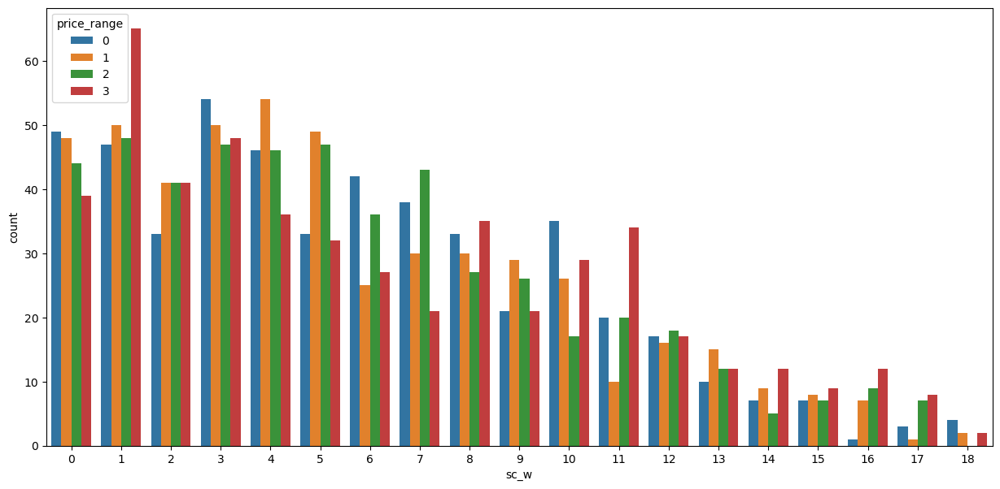

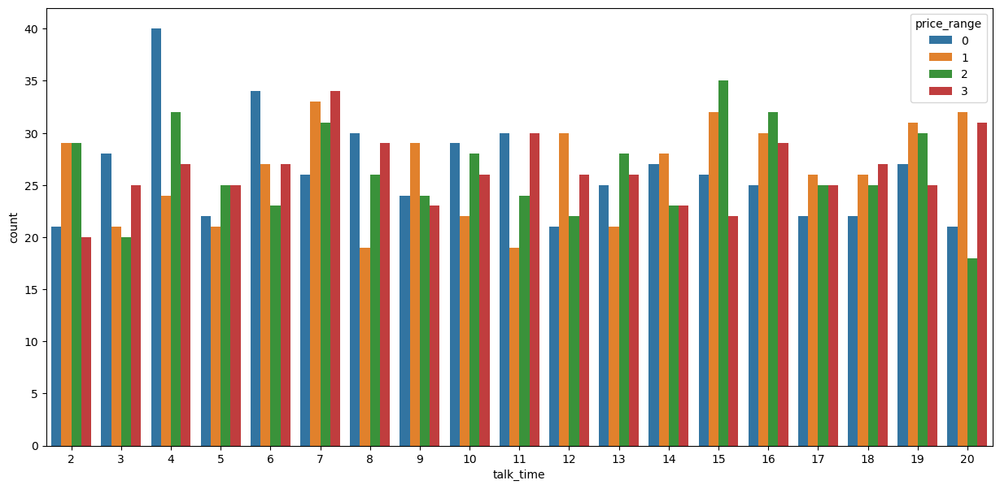

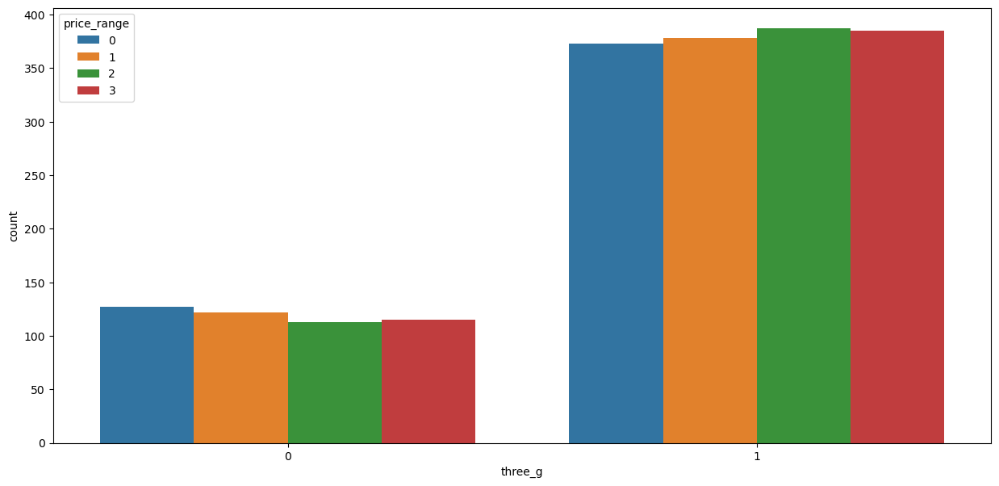

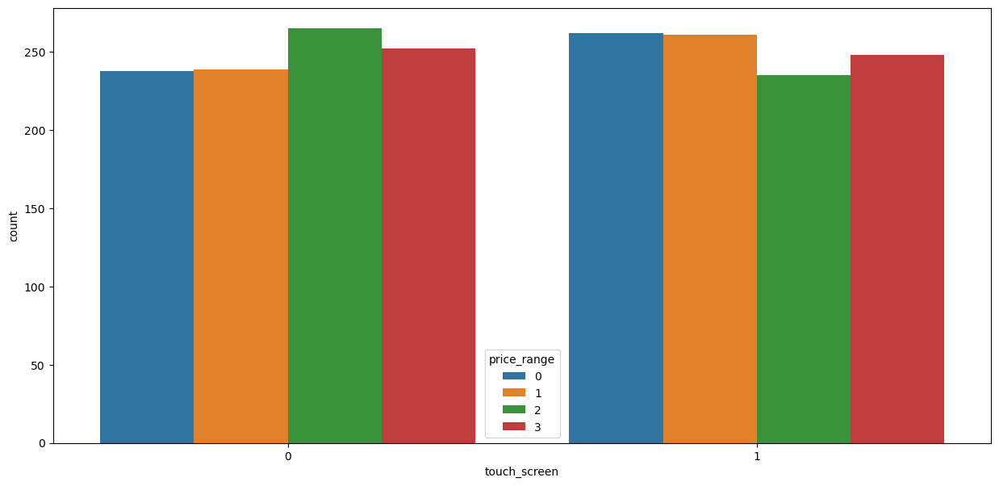

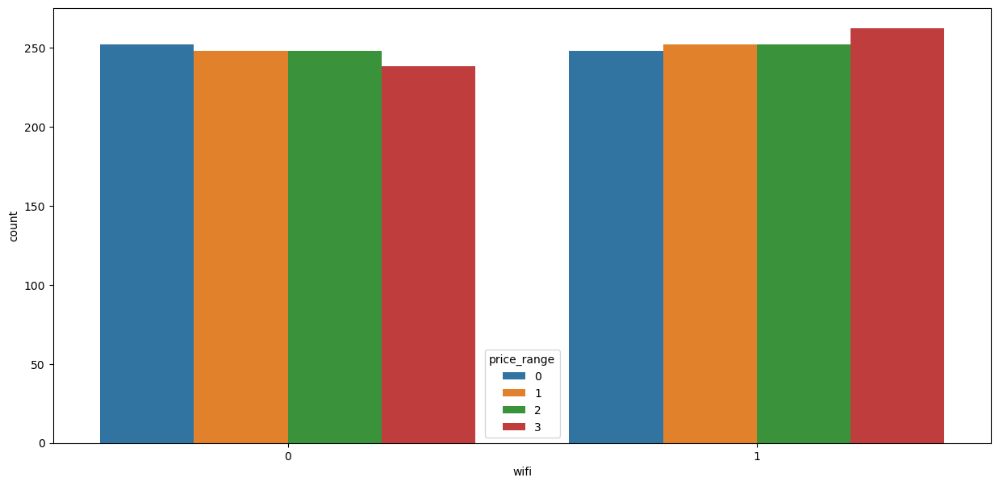

In [24]:
for feature in dis_fea:
    plt.figure(figsize=(15,7))
    sns.countplot(data=df,x=feature,hue='price_range')
    plt.show()

# Correlation between features

In [25]:
c=df[dis_fea].corr()
c

,blue,clock_speed,dual_sim,fc,four_g,m_dep,n_cores,pc,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
blue,1.000000,0.021419,0.035198,0.003593,0.013443,0.004049,0.036161,-0.009952,-0.002952,0.000613,0.013934,-0.030236,0.010061,-0.021863
clock_speed,0.021419,1.000000,-0.001315,-0.000434,-0.043073,-0.014364,-0.005724,-0.005245,-0.029078,-0.007378,-0.011432,-0.046433,0.019756,-0.024471
dual_sim,0.035198,-0.001315,1.000000,-0.029123,0.003187,-0.022142,-0.024658,-0.017143,-0.011949,-0.016666,-0.039404,-0.014008,-0.017117,0.022740
fc,0.003593,-0.000434,-0.029123,1.000000,-0.016560,-0.001791,-0.013356,0.644595,-0.011014,-0.012373,-0.006829,0.001793,-0.014828,0.020085
four_g,0.013443,-0.043073,0.003187,-0.016560,1.000000,-0.001823,-0.029706,-0.005598,0.027166,0.037005,-0.046628,0.584246,0.016758,-0.017620
m_dep,0.004049,-0.014364,-0.022142,-0.001791,-0.001823,1.000000,-0.003504,0.026282,-0.025348,-0.018388,0.017003,-0.012065,-0.002638,-0.028353
n_cores,0.036161,-0.005724,-0.024658,-0.013356,-0.029706,-0.003504,1.000000,-0.001193,-0.000315,0.025826,0.013148,-0.014733,0.023774,-0.009964
pc,-0.009952,-0.005245,-0.017143,0.644595,-0.005598,0.026282,-0.001193,1.000000,0.004938,-0.023819,0.014657,-0.001322,-0.008742,0.005389
sc_h,-0.002952,-0.029078,-0.011949,-0.011014,0.027166,-0.025348,-0.000315,0.004938,1.000000,0.506144,-0.017335,0.012033,-0.020023,0.025929
sc_w,0.000613,-0.007378,-0.016666,-0.012373,0.037005,-0.018388,0.025826,-0.023819,0.506144,1.000000,-0.022821,0.030941,0.012720,0.035423


<AxesSubplot:>

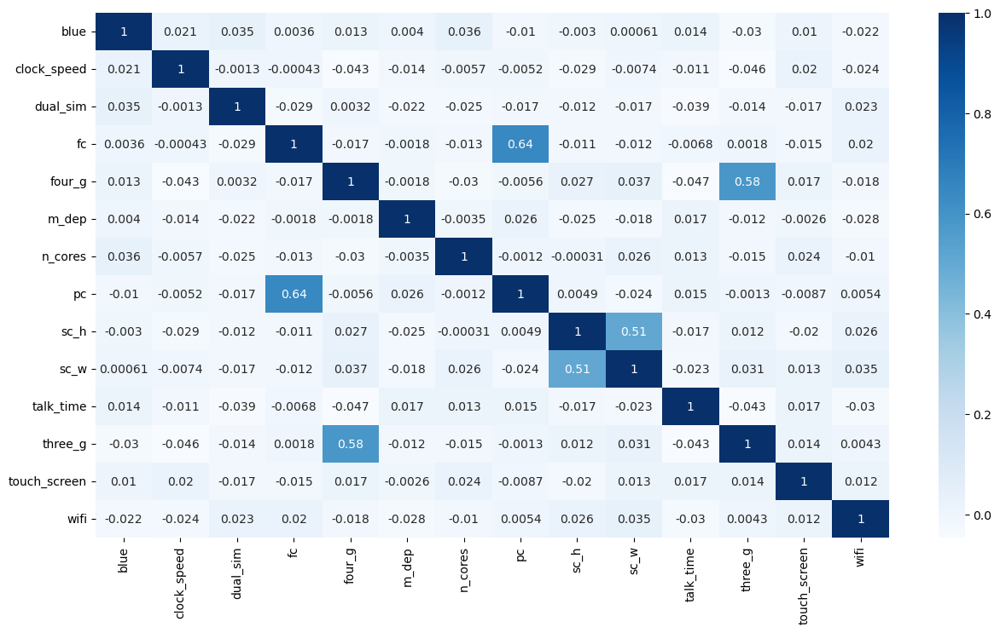

In [26]:
plt.figure(figsize=(15,8))
sns.heatmap(c,annot=True,cmap='Blues')

# Checking for outliers

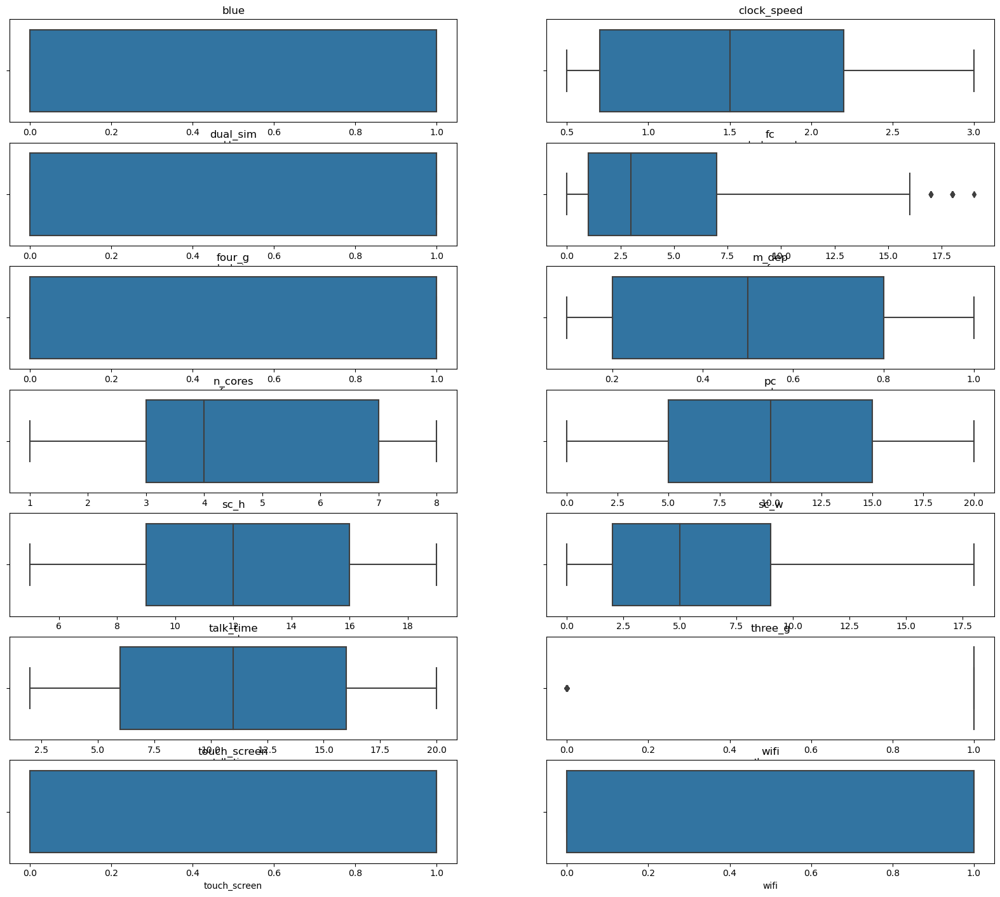

In [27]:
c=1
plt.figure(figsize=(20,40))
for feature in dis_fea:
    plt.subplot(16,2,c)
    plt.title(feature)
    sns.boxplot(data=df,x=feature)
    c+=1

# Univariate analysis of Numerical feature

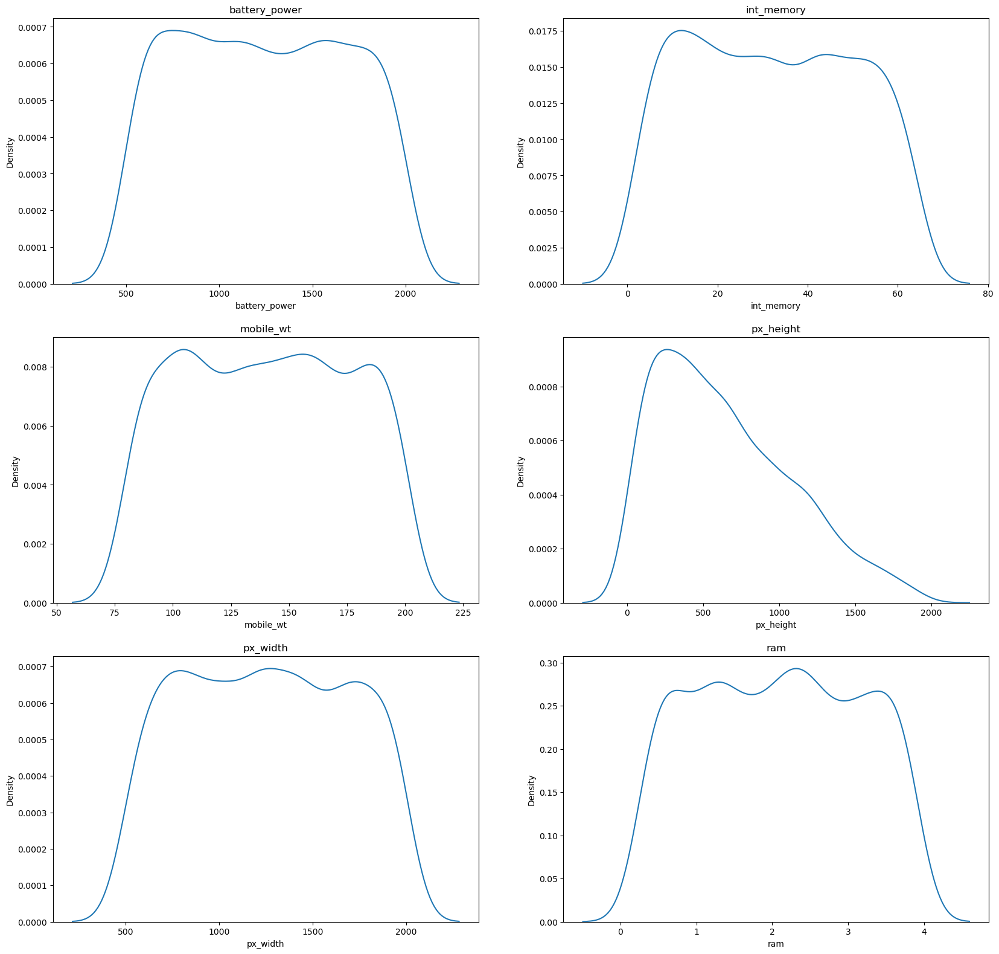

In [28]:
c=1
plt.figure(figsize=(20,40))
for feature in con_fea:
    plt.subplot(6,2,c)
    plt.title(feature)
    sns.kdeplot(data=df,x=feature)
    c+=1

# Checking for Outliers

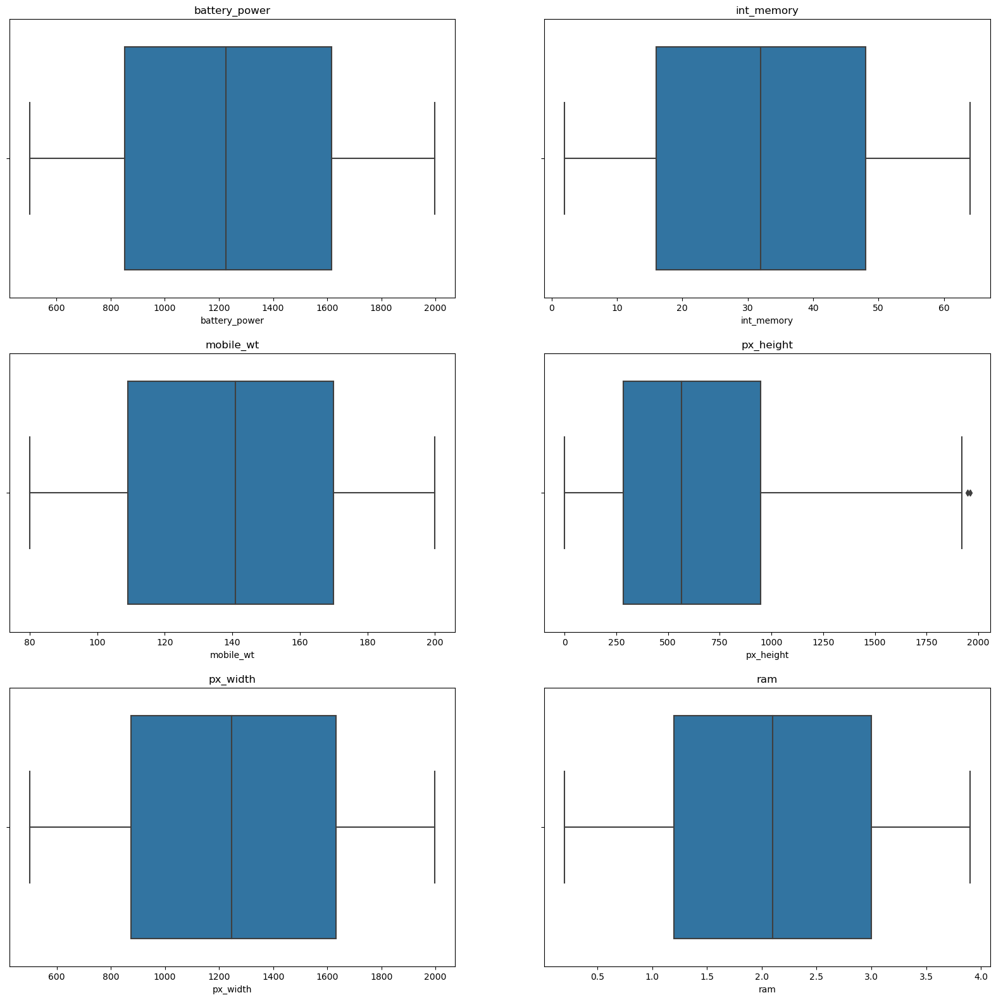

In [29]:
c=1
plt.figure(figsize=(20,40))
for feature in con_fea:
    plt.subplot(6,2,c)
    plt.title(feature)
    sns.boxplot(data=df,x=feature)
    c+=1

# Prediction of Price range using KNN & NaiveBayes Classifier

In [30]:
x=df.iloc[:,:-1].values
x

array([[8.420e+02, 0.000e+00, 2.200e+00, ..., 0.000e+00, 0.000e+00,
        1.000e+00],
       [1.021e+03, 1.000e+00, 5.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [5.630e+02, 1.000e+00, 5.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       ...,
       [1.911e+03, 0.000e+00, 9.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [1.512e+03, 0.000e+00, 9.000e-01, ..., 1.000e+00, 1.000e+00,
        1.000e+00],
       [5.100e+02, 1.000e+00, 2.000e+00, ..., 1.000e+00, 1.000e+00,
        1.000e+00]])

In [31]:
y=df.iloc[:,-1].values
y

array([1, 2, 2, ..., 3, 0, 3], dtype=int64)

In [32]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20)
x_train

array([[1.872e+03, 1.000e+00, 2.300e+00, ..., 1.000e+00, 0.000e+00,
        1.000e+00],
       [9.040e+02, 0.000e+00, 1.800e+00, ..., 1.000e+00, 0.000e+00,
        0.000e+00],
       [7.960e+02, 0.000e+00, 5.000e-01, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       ...,
       [6.030e+02, 1.000e+00, 7.000e-01, ..., 1.000e+00, 1.000e+00,
        1.000e+00],
       [5.300e+02, 0.000e+00, 2.400e+00, ..., 0.000e+00, 1.000e+00,
        0.000e+00],
       [1.043e+03, 0.000e+00, 2.700e+00, ..., 1.000e+00, 0.000e+00,
        0.000e+00]])

In [33]:
x_test

array([[1.454e+03, 1.000e+00, 5.000e-01, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       [8.640e+02, 1.000e+00, 3.000e+00, ..., 1.000e+00, 1.000e+00,
        1.000e+00],
       [1.604e+03, 1.000e+00, 1.900e+00, ..., 1.000e+00, 1.000e+00,
        0.000e+00],
       ...,
       [9.650e+02, 1.000e+00, 5.000e-01, ..., 1.000e+00, 0.000e+00,
        0.000e+00],
       [1.154e+03, 0.000e+00, 1.100e+00, ..., 1.000e+00, 0.000e+00,
        0.000e+00],
       [8.420e+02, 0.000e+00, 2.200e+00, ..., 0.000e+00, 0.000e+00,
        1.000e+00]])

In [34]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.fit_transform(x_test)
x_train

array([[ 1.43392207,  1.01384584,  0.9604443 , ...,  0.57638802,
        -0.99501244,  1.00125078],
       [-0.77738139, -0.98634324,  0.34339046, ...,  0.57638802,
        -0.99501244, -0.99875078],
       [-1.02409707, -0.98634324, -1.26094952, ..., -1.73494238,
         1.00501256, -0.99875078],
       ...,
       [-1.46498712,  1.01384584, -1.01412798, ...,  0.57638802,
         1.00501256,  1.00125078],
       [-1.63174864, -0.98634324,  1.08385507, ..., -1.73494238,
         1.00501256, -0.99875078],
       [-0.45984918, -0.98634324,  1.45408737, ...,  0.57638802,
        -0.99501244, -0.99875078]])

In [35]:
x_test

array([[ 0.53651293,  0.99501244, -1.22308911, ...,  0.49217479,
         0.95118973, -1.07803625],
       [-0.79012578,  0.99501244,  1.76223944, ...,  0.49217479,
         0.95118973,  0.92761259],
       [ 0.87379396,  0.99501244,  0.44869488, ...,  0.49217479,
         0.95118973, -1.07803625],
       ...,
       [-0.56302322,  0.99501244, -1.22308911, ...,  0.49217479,
        -1.05131497, -1.07803625],
       [-0.13804912, -1.00501256, -0.50661025, ...,  0.49217479,
        -1.05131497, -1.07803625],
       [-0.83959366, -1.00501256,  0.80693431, ..., -2.0317985 ,
        -1.05131497,  0.92761259]])

In [36]:
from sklearn.neighbors import KNeighborsClassifier
classifier=KNeighborsClassifier(n_neighbors=10)
classifier.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=10)

In [37]:
y_pred=classifier.predict(x_test)
y_pred

array([3, 1, 2, 1, 0, 0, 3, 2, 3, 1, 0, 3, 3, 1, 2, 1, 3, 2, 3, 0, 1, 3,
       2, 1, 2, 0, 0, 3, 1, 0, 0, 1, 1, 0, 0, 1, 2, 2, 3, 1, 1, 2, 2, 1,
       1, 0, 0, 1, 0, 0, 2, 1, 0, 3, 1, 3, 0, 3, 1, 2, 1, 3, 3, 3, 3, 3,
       3, 1, 1, 2, 1, 2, 3, 3, 2, 0, 0, 2, 3, 0, 0, 2, 3, 0, 1, 0, 1, 1,
       3, 0, 3, 1, 1, 3, 0, 3, 0, 1, 0, 1, 0, 2, 0, 1, 0, 3, 3, 1, 3, 3,
       1, 0, 0, 0, 3, 0, 1, 3, 2, 3, 0, 0, 1, 2, 3, 3, 1, 0, 0, 2, 3, 3,
       2, 1, 1, 1, 2, 2, 0, 0, 3, 2, 1, 0, 0, 0, 3, 1, 0, 2, 0, 3, 3, 0,
       1, 1, 0, 0, 2, 0, 0, 2, 1, 0, 2, 0, 2, 2, 2, 1, 0, 2, 2, 2, 3, 0,
       0, 0, 1, 3, 3, 0, 0, 1, 1, 2, 1, 0, 3, 1, 1, 2, 1, 1, 3, 2, 1, 0,
       0, 2, 3, 2, 2, 2, 3, 2, 2, 0, 3, 0, 1, 1, 2, 1, 2, 0, 3, 2, 3, 1,
       0, 0, 3, 2, 0, 1, 0, 2, 0, 1, 3, 2, 2, 1, 1, 2, 3, 1, 1, 2, 0, 3,
       2, 0, 3, 1, 0, 3, 0, 2, 0, 3, 1, 0, 1, 3, 0, 0, 0, 0, 3, 1, 2, 2,
       1, 1, 3, 3, 0, 1, 1, 0, 3, 3, 1, 0, 0, 1, 0, 2, 2, 0, 0, 1, 3, 1,
       2, 1, 1, 1, 1, 3, 1, 1, 3, 3, 0, 0, 0, 3, 1,

In [38]:
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,ConfusionMatrixDisplay
score=accuracy_score(y_test,y_pred)
score

0.5375

In [39]:
#Fetching values in n_neighbors
a=[]
for i in range(1,50):
    kclassifier=KNeighborsClassifier(n_neighbors=i)
    kclassifier.fit(x_train,y_train)
    y_pred=kclassifier.predict(x_test)
    a.append(accuracy_score(y_test,y_pred))
print(a)

[0.435, 0.44, 0.45, 0.4875, 0.485, 0.5025, 0.5375, 0.535, 0.53, 0.5375, 0.565, 0.5825, 0.5725, 0.5525, 0.5675, 0.5875, 0.59, 0.5925, 0.605, 0.6075, 0.6125, 0.6425, 0.6475, 0.6375, 0.6425, 0.6425, 0.6425, 0.6475, 0.635, 0.6475, 0.6425, 0.6475, 0.66, 0.675, 0.675, 0.6625, 0.675, 0.655, 0.655, 0.6575, 0.67, 0.655, 0.6775, 0.66, 0.6875, 0.6725, 0.685, 0.665, 0.685]


# Accuracy score is low because we need to first perform feature selection and find those features that are best which describe the targe_feature and exclude others

In [40]:
kclassreport=classification_report(y_test,y_pred)
print(kclassreport)

              precision    recall  f1-score   support

           0       0.81      0.86      0.83       102
           1       0.64      0.56      0.60       103
           2       0.54      0.57      0.56       101
           3       0.75      0.74      0.75        94

    accuracy                           0.69       400
   macro avg       0.68      0.69      0.68       400
weighted avg       0.68      0.69      0.68       400



In [41]:
kcmr=confusion_matrix(y_test,y_pred)
kcmr

array([[88, 13,  1,  0],
       [20, 58, 25,  0],
       [ 1, 19, 58, 23],
       [ 0,  1, 23, 70]], dtype=int64)

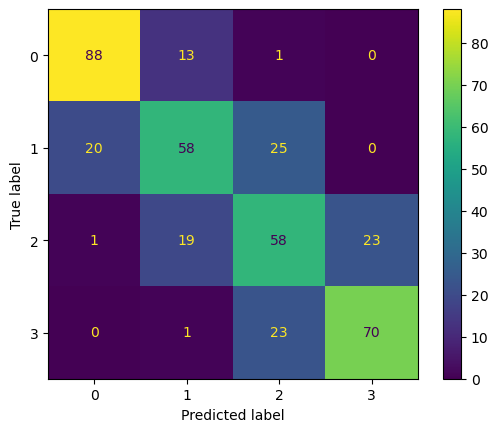

In [42]:
cmd=ConfusionMatrixDisplay(kcmr,display_labels=['0','1','2','3'])
cmd.plot()

# Naive_Bayes Model Classification

In [43]:
from sklearn.naive_bayes import GaussianNB
nb_class=GaussianNB()
nb_class.fit(x_train,y_train)

GaussianNB()

In [44]:
y_pred=nb_class.predict(x_test)
y_pred

array([3, 3, 1, 2, 0, 0, 3, 2, 1, 0, 1, 3, 3, 1, 2, 2, 3, 1, 1, 0, 0, 3,
       2, 2, 3, 1, 0, 3, 3, 0, 0, 1, 0, 0, 0, 2, 2, 1, 3, 3, 1, 2, 1, 2,
       2, 0, 2, 0, 1, 0, 1, 1, 1, 3, 2, 3, 1, 3, 2, 3, 2, 3, 3, 3, 3, 3,
       3, 2, 1, 2, 0, 2, 2, 2, 2, 1, 1, 3, 3, 2, 0, 2, 2, 0, 3, 0, 2, 1,
       3, 0, 3, 1, 0, 3, 1, 3, 0, 1, 0, 2, 0, 2, 0, 1, 1, 3, 3, 2, 3, 3,
       0, 0, 0, 0, 3, 1, 1, 3, 2, 2, 1, 0, 2, 3, 2, 3, 2, 0, 0, 1, 3, 3,
       1, 1, 0, 1, 1, 2, 1, 0, 3, 1, 2, 1, 0, 2, 3, 0, 0, 2, 0, 3, 3, 0,
       1, 2, 0, 2, 3, 0, 0, 2, 2, 0, 3, 1, 3, 2, 1, 1, 0, 2, 2, 2, 3, 0,
       0, 0, 0, 2, 2, 1, 0, 1, 1, 3, 2, 1, 3, 0, 0, 0, 0, 1, 3, 3, 1, 0,
       1, 1, 3, 1, 3, 3, 3, 3, 2, 1, 2, 2, 3, 3, 2, 1, 2, 0, 3, 1, 3, 1,
       0, 0, 3, 2, 0, 2, 0, 3, 1, 0, 3, 3, 3, 2, 3, 1, 2, 1, 0, 3, 0, 1,
       3, 0, 2, 2, 0, 2, 1, 2, 0, 3, 0, 2, 2, 3, 2, 0, 0, 0, 3, 0, 2, 2,
       0, 2, 3, 3, 1, 1, 2, 0, 3, 2, 2, 1, 2, 1, 0, 2, 2, 0, 0, 0, 3, 2,
       2, 0, 1, 1, 1, 3, 0, 2, 3, 3, 0, 0, 0, 1, 0,

In [45]:
nb_score=accuracy_score(y_test,y_pred)
nb_score

0.815

In [46]:
ncm=confusion_matrix(y_test,y_pred)
ncm

array([[92, 10,  0,  0],
       [12, 67, 24,  0],
       [ 0, 16, 76,  9],
       [ 0,  0,  3, 91]], dtype=int64)

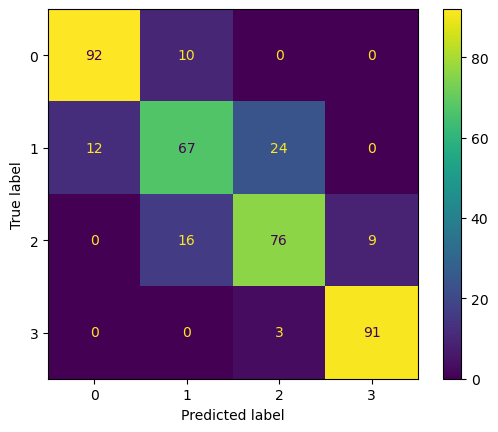

In [47]:
ncmd=ConfusionMatrixDisplay(ncm,display_labels=[0,1,2,3])
ncmd.plot()

In [48]:
nbcr=classification_report(y_test,y_pred)
print(nbcr)

              precision    recall  f1-score   support

           0       0.88      0.90      0.89       102
           1       0.72      0.65      0.68       103
           2       0.74      0.75      0.75       101
           3       0.91      0.97      0.94        94

    accuracy                           0.81       400
   macro avg       0.81      0.82      0.82       400
weighted avg       0.81      0.81      0.81       400

